So in this we are first using YOLO-NAS for object detection. We then instatiate the mask process of the SAM model and check how the mask are being generated by the SAM model. We then use these masks generate and loop through the objects to create a combined image that generates labels on all the detected and masked objects.

In [ ]:
!pip install --upgrade Pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 14.3 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.


In [ ]:
!pip install ultralytics install super-gradients -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 33.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 59.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 28.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 36.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━

In [ ]:

!pip install git+https://github.com/facebookresearch/segment-anything.git -q
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

  Preparing metadata (setup.py) ... done
--2024-06-05 03:32:10--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.162.163.51, 3.162.163.11, 3.162.163.19, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.162.163.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   214MB/s    in 16s     

2024-06-05 03:32:26 (150 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [ ]:
import random
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor, SamAutomaticMaskGenerator
from super_gradients.training import models

For Image 5

In [ ]:
!ls output_folder

ls: cannot access 'output_folder': No such file or directory


In [ ]:
!mkdir output_folder

In [ ]:
!ls output_folder/image.jpg

In [ ]:
# Step 2: Import necessary libraries
import cv2
from ultralytics import YOLO

# Step 3: Load the image
image_path = '/content/6.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 4: Load the YOLO model
model = YOLO('/content/fsc5_400e.pt')

# Step 5: Run the prediction and store results
conf_threshold = 0.1
detection_pred = model.predict(source=image_path, conf=conf_threshold)

# Step 6: Extract bounding box information
# Assuming detection_pred contains the result object from which you can access the bounding boxes
# The structure of detection_pred may vary depending on the exact YOLO implementation
# Below is a typical way to access this information in the Ultralytics YOLO library

bounding_boxes = []
for result in detection_pred:
    boxes = result.boxes  # Box coordinates and confidence
    for box in boxes:
        x1, y1, x2, y2 = box.xyxy[0]  # Extract bounding box coordinates
        confidence = box.conf  # Extract confidence score
        label = box.cls  # Extract class label
        bounding_boxes.append((x1, y1, x2, y2, confidence, label))

# Step 7: Save the output image with detections
output_path = '/content/image.jpg'

# Step 8: Print the bounding boxes
print("Bounding Boxes:", bounding_boxes)



image 1/1 /content/6.jpg: 448x640 9 hot-air-balloons, 52.1ms
Speed: 15.0ms preprocess, 52.1ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Bounding Boxes: [(tensor(391.0469, device='cuda:0'), tensor(115.2312, device='cuda:0'), tensor(428.6447, device='cuda:0'), tensor(168.5238, device='cuda:0'), tensor([0.9137], device='cuda:0'), tensor([48.], device='cuda:0')), (tensor(304.4678, device='cuda:0'), tensor(82.7391, device='cuda:0'), tensor(338.2670, device='cuda:0'), tensor(133.7895, device='cuda:0'), tensor([0.8875], device='cuda:0'), tensor([48.], device='cuda:0')), (tensor(533.1952, device='cuda:0'), tensor(123.2030, device='cuda:0'), tensor(567.8286, device='cuda:0'), tensor(175.0778, device='cuda:0'), tensor([0.8791], device='cuda:0'), tensor([48.], device='cuda:0')), (tensor(487.2749, device='cuda:0'), tensor(107.3812, device='cuda:0'), tensor(527.5170, device='cuda:0'), tensor(170.0640, device='cuda:0'), tensor([0.8615], device='cuda:0'), tensor([48.], device=

In [ ]:
image_path = '/content/5.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


model = !yolo predict model='/content/fsc5_400e.pt' source = '/content/5.jpg', conf=0.1

detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image.jpg')

AttributeError: 'SList' object has no attribute 'predict'

In [ ]:
print(dir(detection_pred))

['__abstractmethods__', '__annotations__', '__class__', '__dataclass_fields__', '__dataclass_params__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__match_args__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__slots__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', 'class_names', 'draw', 'image', 'prediction', 'save', 'show']


In [ ]:
# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name


AttributeError: 'list' object has no attribute 'prediction'


image 1/1 /content/5.jpg: 480x640 119 hot-air-balloons, 10.4ms
Speed: 7.9ms preprocess, 10.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


In [ ]:
# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
confidence = detection_pred[0].prediction.confidence.tolist()
labels = detection_pred[0].prediction.labels.tolist()

AttributeError: 'list' object has no attribute '_images_prediction_lst'


image 1/1 /content/5.jpg: 480x640 119 hot-air-balloons, 11.1ms
Speed: 4.4ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


In [ ]:

import cv2
from ultralytics import YOLO

# Step 3: Load the image
image_path = '/content/6.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Step 4: Load the YOLO model
model = YOLO('/content/fsc5_400e.pt')

# Step 5: Run the prediction and store results
conf_threshold = 0.1
detection_preds = model.predict(source=image_path, conf=conf_threshold)

# Step 6: Extract bounding box information
bounding_boxes = []
confidence_scores = []
labels = []

for result in detection_preds:
    boxes = result.boxes  # Extract boxes from result
    for box in boxes:
        x1, y1, x2, y2 = box.xyxy[0]  # Extract bounding box coordinates
        confidence = box.conf.item()  # Extract confidence score
        label = box.cls.item()  # Extract class label
        bounding_boxes.append((x1, y1, x2, y2))
        confidence_scores.append(confidence)
        labels.append(label)

# Step 7: Save the output image with detections
output_path = '/content/output_folder/image.jpg'


# Step 8: Print the bounding boxes, confidence scores, and labels
print("Bounding Boxes:", bounding_boxes)
print("Confidence Scores:", confidence_scores)
print("Labels:", labels)



image 1/1 /content/6.jpg: 448x640 9 hot-air-balloons, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Bounding Boxes: [(tensor(391.0469, device='cuda:0'), tensor(115.2312, device='cuda:0'), tensor(428.6447, device='cuda:0'), tensor(168.5238, device='cuda:0')), (tensor(304.4678, device='cuda:0'), tensor(82.7391, device='cuda:0'), tensor(338.2670, device='cuda:0'), tensor(133.7895, device='cuda:0')), (tensor(533.1952, device='cuda:0'), tensor(123.2030, device='cuda:0'), tensor(567.8286, device='cuda:0'), tensor(175.0778, device='cuda:0')), (tensor(487.2749, device='cuda:0'), tensor(107.3812, device='cuda:0'), tensor(527.5170, device='cuda:0'), tensor(170.0640, device='cuda:0')), (tensor(102.6590, device='cuda:0'), tensor(33.5989, device='cuda:0'), tensor(147.2941, device='cuda:0'), tensor(94.0285, device='cuda:0')), (tensor(24.9620, device='cuda:0'), tensor(82.2680, device='cuda:0'), tensor(66.0496, device='cuda:0'), tensor(135.310

In [ ]:
model = !yolo predict model='/content/fsc5_400e.pt' source = '/content/649.jpg', conf=0.1

In [ ]:
# Helper functions - https://github.com/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb

def show_mask(mask, ax, random_color=False):
    if random_color:
      color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
      color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=365):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', maker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [ ]:
# SAM Model for masking
sam_checkpoint = 'sam_vit_h_4b8939.pth'
model_type = "vit_h"
device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device)

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [ ]:
image_path = '/content/649.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

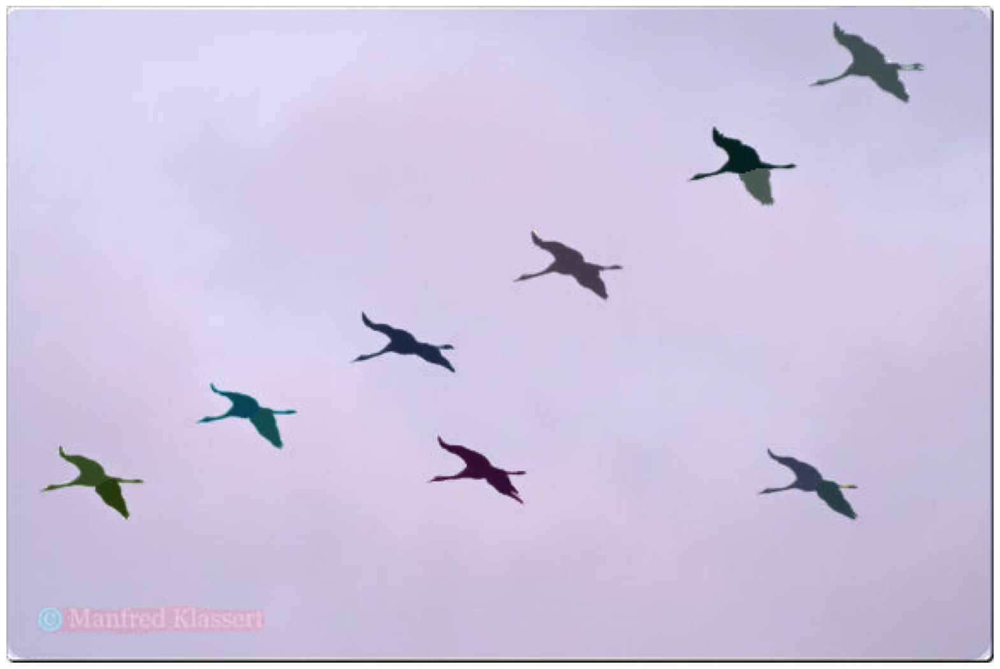

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Load Class Names from COCO dataset
classNames = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck", "boat",
          "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat",
          "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella",
          "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat",
          "baseball glove", "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup",
          "fork", "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli",
          "carrot", "hot dog", "pizza", "donut", "cake", "chair", "sofa", "pottedplant", "bed",
          "diningtable", "toilet", "tvmonitor", "laptop", "mouse", "remote", "keyboard", "cell phone",
          "microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors",
          "teddy bear", "hair drier", "toothbrush"
        ]

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

In [ ]:
# Ensure necessary libraries are imported
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Assuming predictor and classNames are defined elsewhere in your code
# Ensure they are properly defined and imported before running this script

# Loop through detections
for i, label in enumerate(labels):

    input_box = bounding_boxes[i].cpu().numpy()  # Access the bounding box tuple directly
    # Predict mask using SAM (this code assumes `predictor` is defined and initialized elsewhere)
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=np.array(input_box)[None, :].cpu(),  # Convert the tuple to an array, add a batch dimension, and move to CPU
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Initialize combined_mask if not already done
    if i == 0:
        combined_mask = np.zeros_like(image)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('/content/output_folder/prediction.jpg')  # Save the combined output
plt.show()


AttributeError: 'tuple' object has no attribute 'cpu'

In [ ]:
# Ensure necessary libraries are imported
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Assuming predictor and classNames are defined elsewhere in your code
# Ensure they are properly defined and imported before running this script

# Loop through detections
for i, label in enumerate(labels):

    input_box = bounding_boxes[i]  # Access the bounding box tuple directly
    # Predict mask using SAM (this code assumes `predictor` is defined and initialized elsewhere)
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=np.array(input_box)[None, :],  # Convert the tuple to an array and add a batch dimension
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Initialize combined_mask if not already done
    if i == 0:
        combined_mask = np.zeros_like(image)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('/content/output_folder/prediction.jpg')  # Save the combined output
plt.show()


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [ ]:
# Ensure necessary libraries are imported
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Assuming predictor and classNames are defined elsewhere in your code
# Ensure they are properly defined and imported before running this script

# Ensure bounding_boxes is a list of tuples
if not all(isinstance(box, tuple) for box in bounding_boxes):
    # If bounding_boxes contains tensors or arrays, convert them to tuples
    bounding_boxes = [tuple(box.tolist()) for box in bounding_boxes]

# Loop through detections
for i, label in enumerate(labels):

    input_box = tuple(bounding_boxes[i].cpu().numpy())  # Convert tensor to numpy array, then to tuple
    # Predict mask using SAM (this code assumes `predictor` is defined and initialized elsewhere)
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=np.array(input_box)[None, :],  # Convert the tuple to an array and add a batch dimension
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Initialize combined_mask if not already done
    if i == 0:
        combined_mask = np.zeros_like(image)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('/content/output_folder/prediction.jpg')  # Save the combined output
plt.show()


AttributeError: 'tuple' object has no attribute 'cpu'

In [ ]:
# Ensure necessary libraries are imported
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Assuming predictor and classNames are defined elsewhere in your code
# Ensure they are properly defined and imported before running this script

# Ensure bounding_boxes is a list of tuples
if not all(isinstance(box, tuple) for box in bounding_boxes):
    # If bounding_boxes contains tensors or arrays, convert them to tuples
    bounding_boxes = [tuple(box.tolist()) for box in bounding_boxes]

# Loop through detections
for i, label in enumerate(labels):

    input_box = bounding_boxes[i]  # Access the bounding box tuple directly
    # Predict mask using SAM (this code assumes `predictor` is defined and initialized elsewhere)
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=np.array(input_box)[None, :],  # Convert the tuple to an array and add a batch dimension
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Initialize combined_mask if not already done
    if i == 0:
        combined_mask = np.zeros_like(image)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('/content/output_folder/prediction.jpg')  # Save the combined output
plt.show()


TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [ ]:
# Ensure necessary libraries are imported
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

# Assuming predictor and classNames are defined elsewhere in your code
# Ensure they are properly defined and imported before running this script

# Loop through detections
for i, label in enumerate(labels):

    input_box = bounding_boxes[i].cpu().numpy()
    # Predict mask using SAM (this code assumes `predictor` is defined and initialized elsewhere)
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Initialize combined_mask if not already done
    if i == 0:
        combined_mask = np.zeros_like(image)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('/content/output_folder/prediction.jpg')  # Save the combined output
plt.show()


AttributeError: 'tuple' object has no attribute 'cpu'

In [ ]:
# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction.jpg')  # Save the combined output
plt.show()


NameError: name 'bboxes_xyxy' is not defined

Number of objects detected in the image:  35
Mean Squared Error (MSE):  1600.0
Root Mean Squared Error (RMSE):  40.0


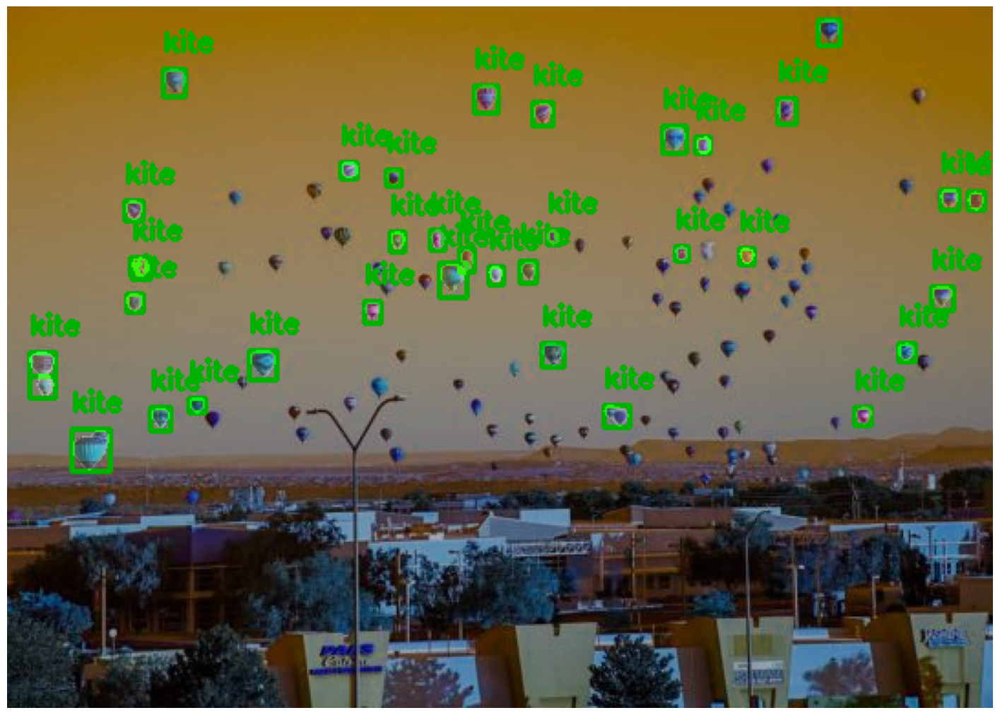

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 75
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction.jpg')  # Save the combined output
plt.show()


For Image 189

[2024-02-16 04:42:32] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-02-16 04:42:33] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2024-02-16 04:42:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


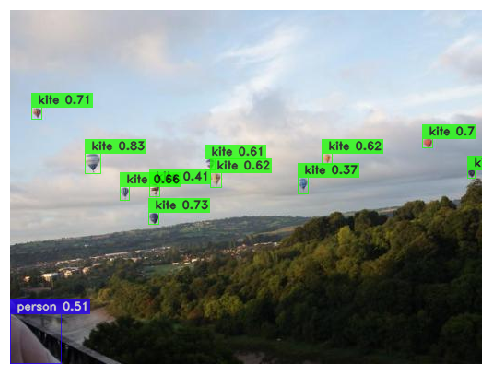

[2024-02-16 04:42:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
image_path = '/content/3.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

model = models.get('yolo_nas_l', pretrained_weights="coco")
model.predict(image, conf=0.25).show()

conf_threshold = 0.25
detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image1.jpg')

In [ ]:
# Extract bounding boxes, confidence scores, and labels
#detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

#bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
#confidence = detection_pred[0].prediction.confidence.tolist()
#labels = detection_pred[0].prediction.labels.tolist()

# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name

[2024-02-16 04:42:47] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


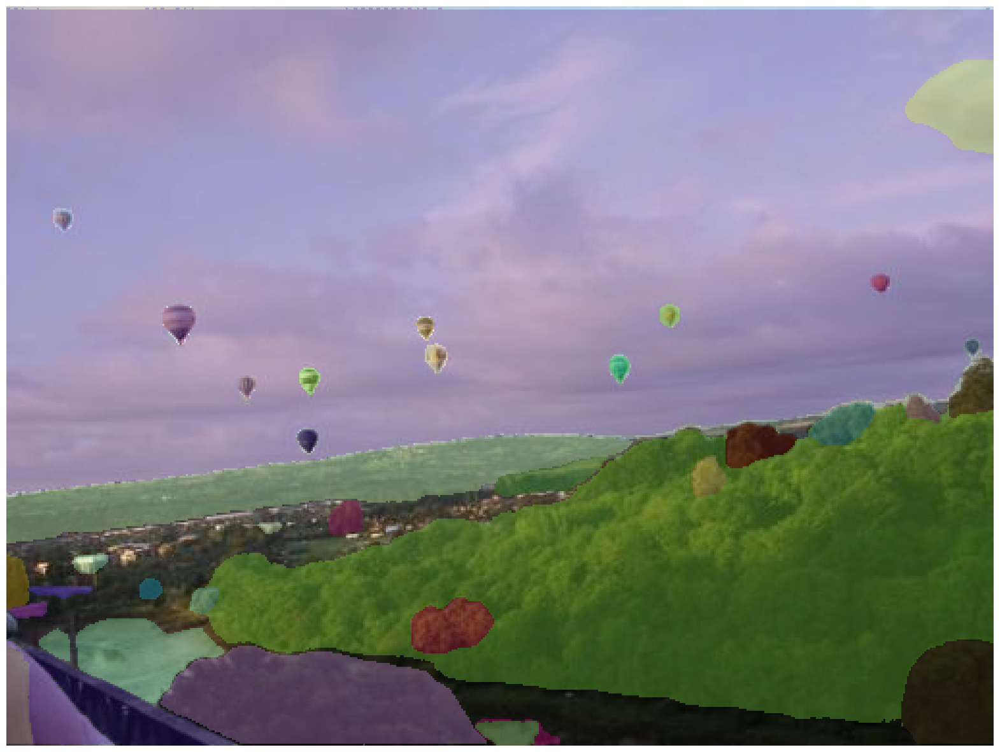

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

Number of objects detected in the image:  12
Mean Squared Error (MSE):  36.0
Root Mean Squared Error (RMSE):  6.0


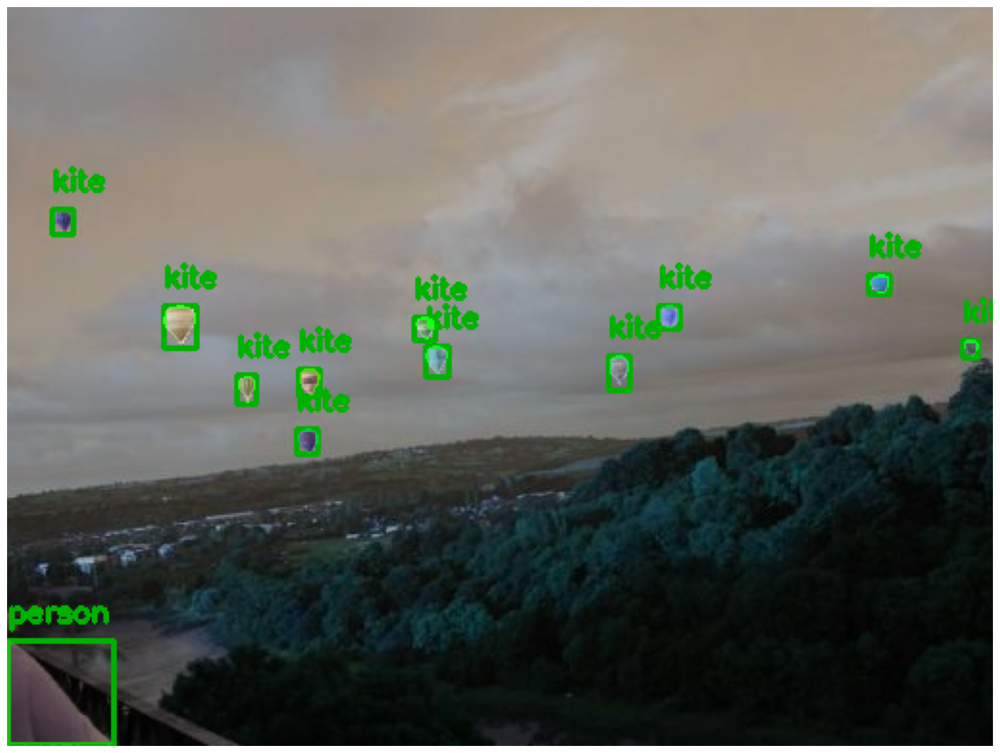

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 18
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction.jpg')  # Save the combined output
plt.show()


Originally 18, predicted 17

[2024-02-16 04:45:21] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-02-16 04:45:21] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2024-02-16 04:45:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


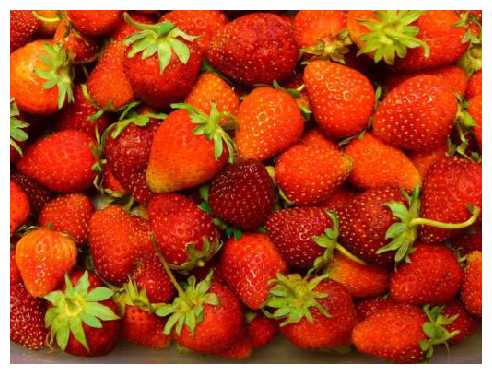

[2024-02-16 04:45:24] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
image_path = '/content/312.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

model = models.get('yolo_nas_l', pretrained_weights="coco")
model.predict(image, conf=0.25).show()

conf_threshold = 0.25
detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image2.jpg')

In [ ]:
# Extract bounding boxes, confidence scores, and labels
#detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

#bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
#confidence = detection_pred[0].prediction.confidence.tolist()
#labels = detection_pred[0].prediction.labels.tolist()
# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name

[2024-02-16 04:45:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


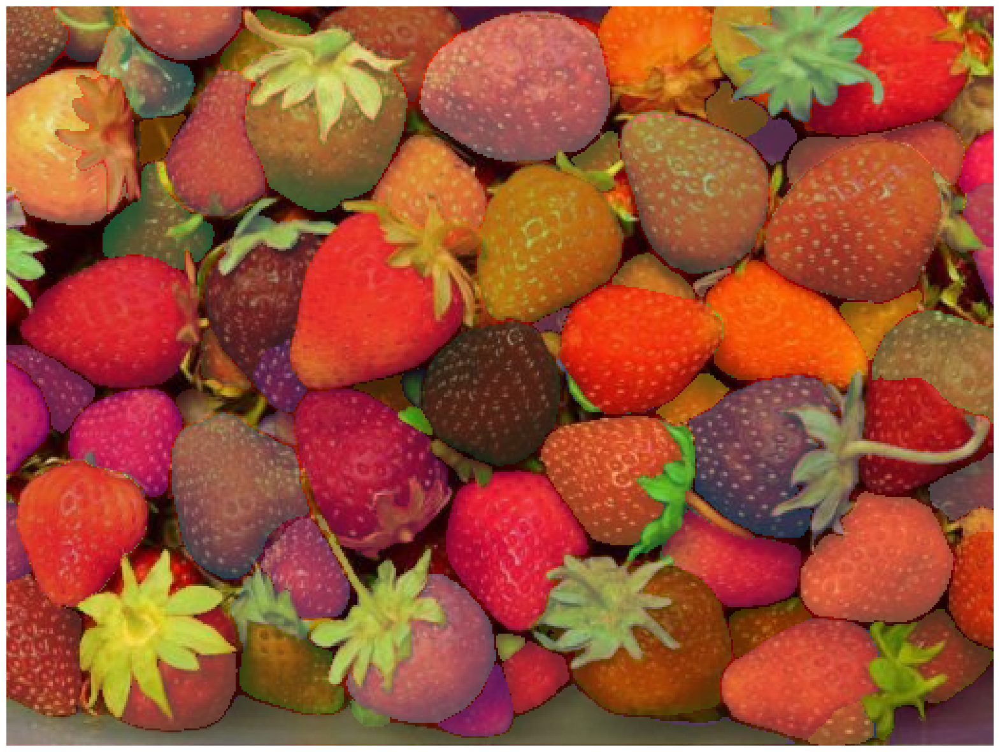

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

Number of objects detected in the image:  0
Mean Squared Error (MSE):  441.0
Root Mean Squared Error (RMSE):  21.0


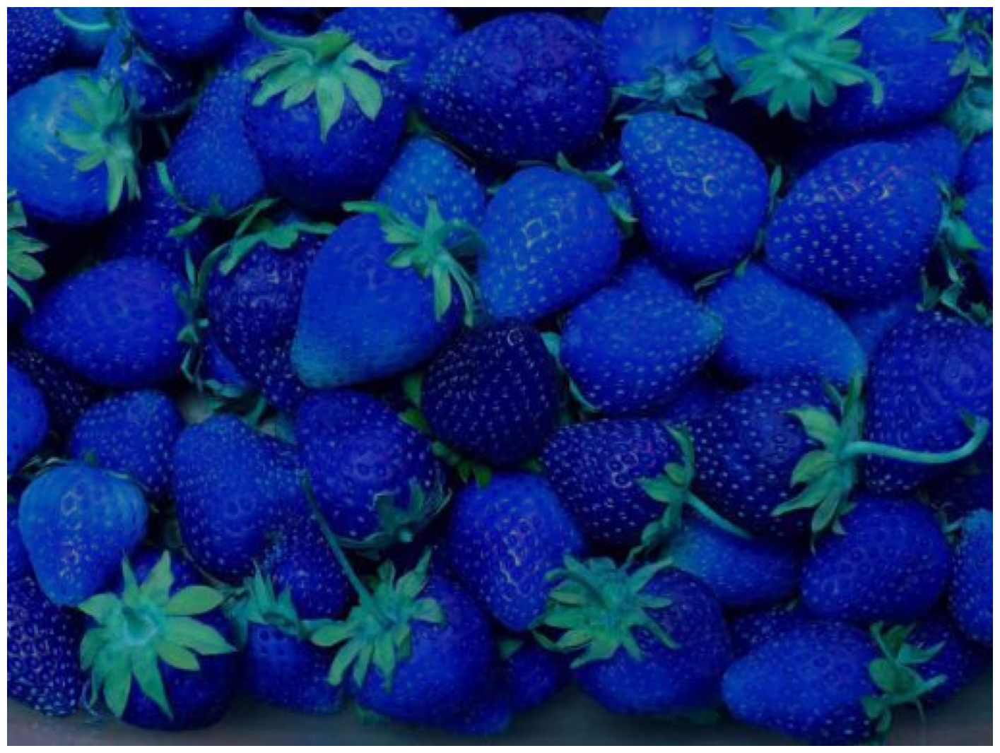

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 21
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction1.jpg')  # Save the combined output
plt.show()


Originally 21, predicted 28

Now for image 2

[2024-02-11 23:50:25] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-02-11 23:50:25] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2024-02-11 23:50:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


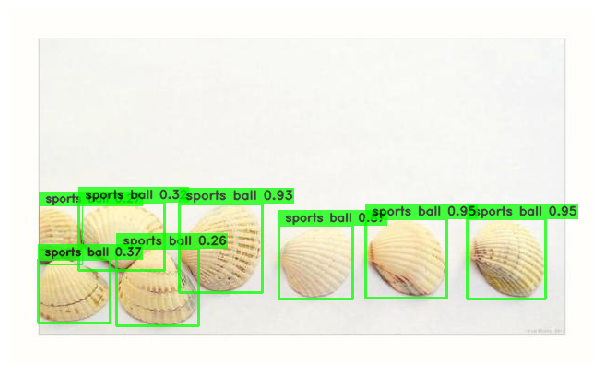

[2024-02-11 23:50:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
image_path = '/content/2.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

model = models.get('yolo_nas_l', pretrained_weights="coco")
model.predict(image, conf=0.25).show()

conf_threshold = 0.25
detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image3.jpg')

In [ ]:
# Extract bounding boxes, confidence scores, and labels
#detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

#bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
#confidence = detection_pred[0].prediction.confidence.tolist()
#labels = detection_pred[0].prediction.labels.tolist()

# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name

[2024-02-11 23:50:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


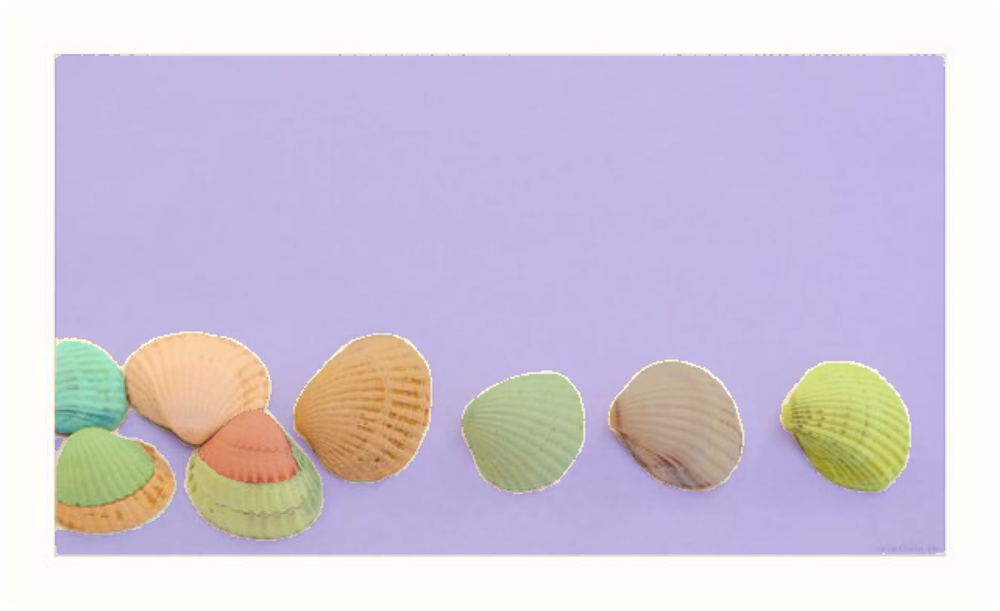

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

Number of objects detected in the image:  8
Mean Squared Error (MSE):  0.0
Root Mean Squared Error (RMSE):  0.0


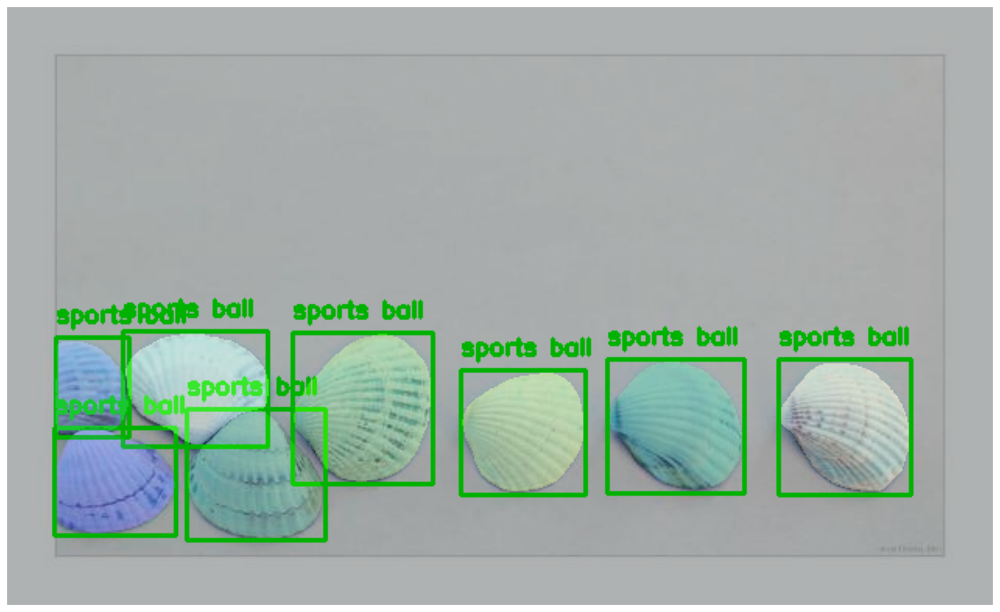

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 8
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction2.jpg')  # Save the combined output
plt.show()


Number of objects detected in the image:  8


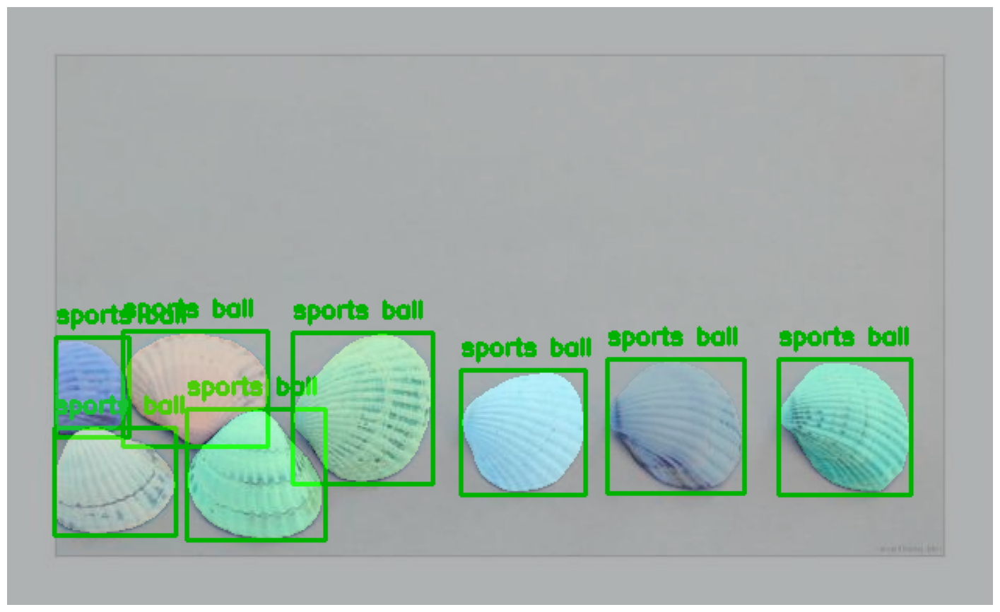

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)

# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction2.jpg')  # Save the combined output
plt.show()


Just provide the actual value of the object, and use the predicted values from the object and calculate the MSE and RMSE values.

[2024-02-11 23:54:35] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-02-11 23:54:35] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2024-02-11 23:54:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


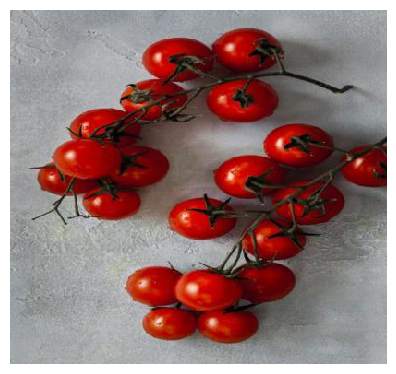

[2024-02-11 23:54:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
image_path = '/content/97.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

model = models.get('yolo_nas_l', pretrained_weights="coco")
model.predict(image, conf=0.25).show()

conf_threshold = 0.25
detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image3.jpg')

In [ ]:
# Extract bounding boxes, confidence scores, and labels
#detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

#bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
#confidence = detection_pred[0].prediction.confidence.tolist()
#labels = detection_pred[0].prediction.labels.tolist()

# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name

[2024-02-11 23:54:57] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


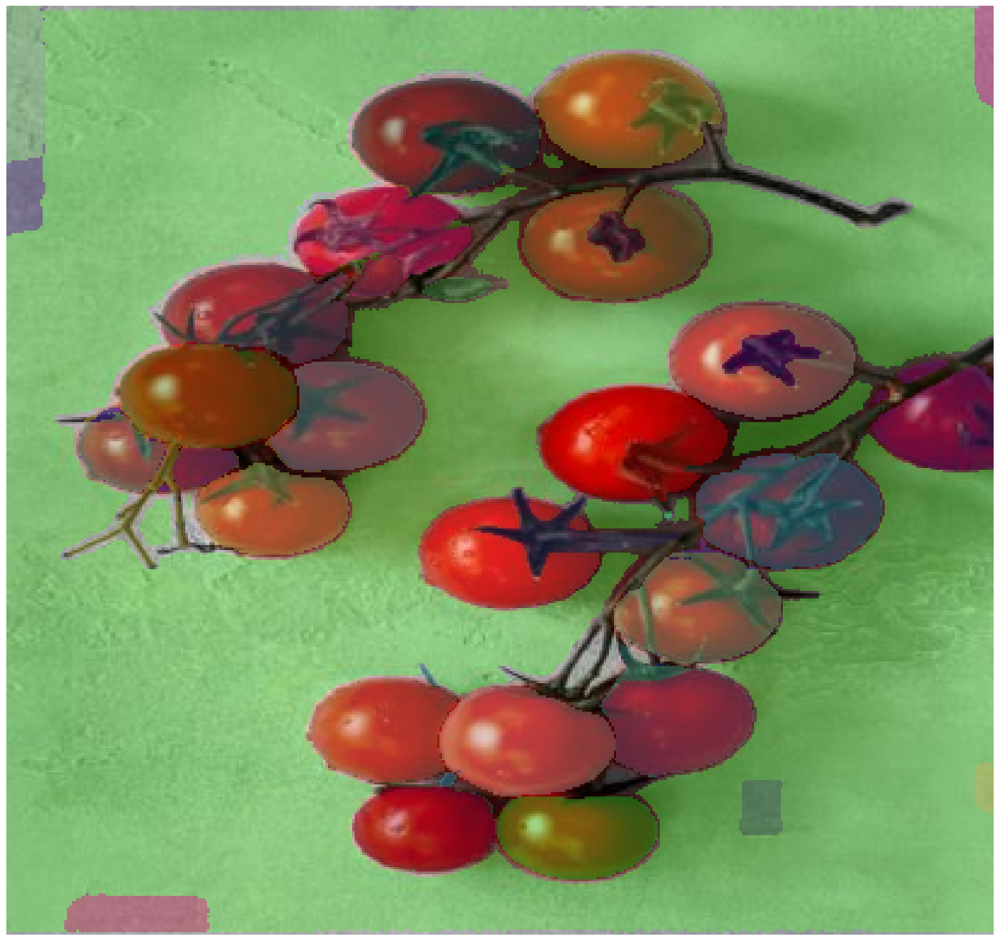

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

Number of objects detected in the image:  0
Mean Squared Error (MSE):  400.0
Root Mean Squared Error (RMSE):  20.0


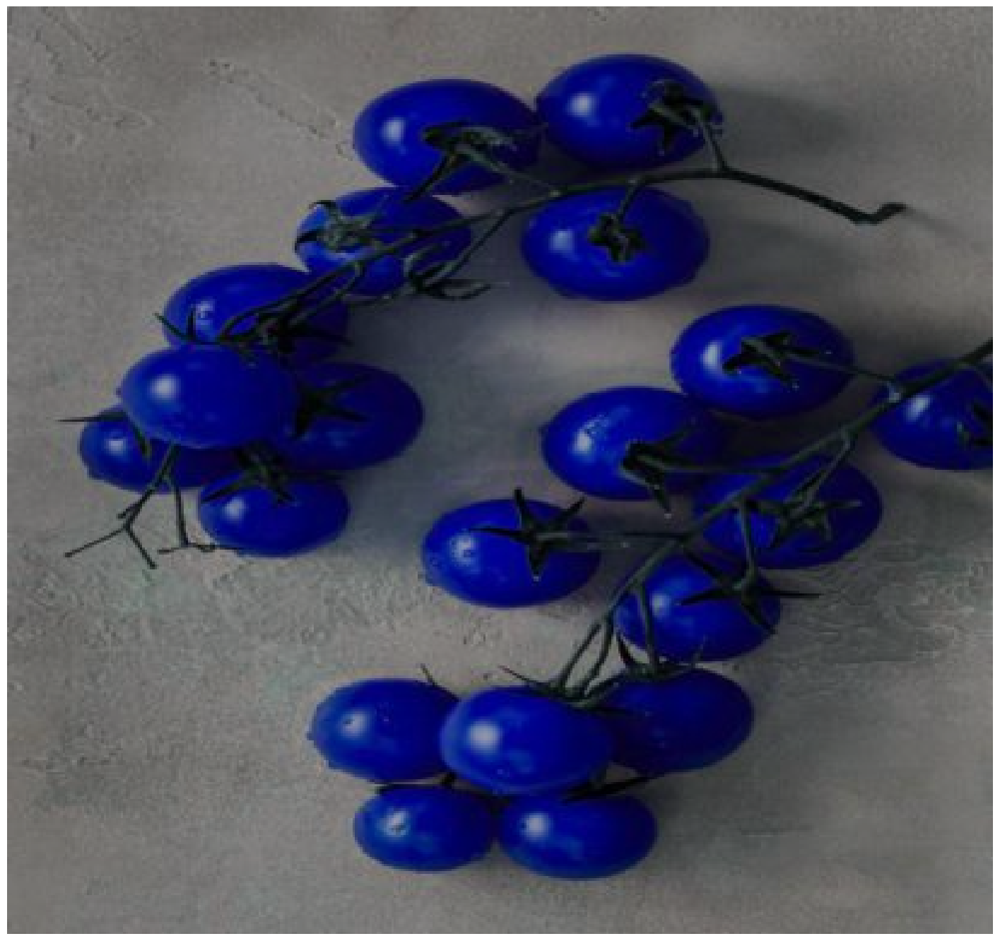

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 20
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction2.jpg')  # Save the combined output
plt.show()


[2024-02-11 23:58:08] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-02-11 23:58:08] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2024-02-11 23:58:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


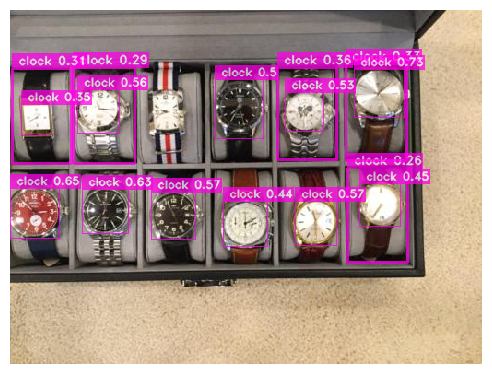

[2024-02-11 23:58:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
image_path = '/content/988.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

model = models.get('yolo_nas_l', pretrained_weights="coco")
model.predict(image, conf=0.25).show()

conf_threshold = 0.25
detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image4.jpg')

In [ ]:
# Extract bounding boxes, confidence scores, and labels
#detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

#bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
#confidence = detection_pred[0].prediction.confidence.tolist()
#labels = detection_pred[0].prediction.labels.tolist()

# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name

[2024-02-11 23:58:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


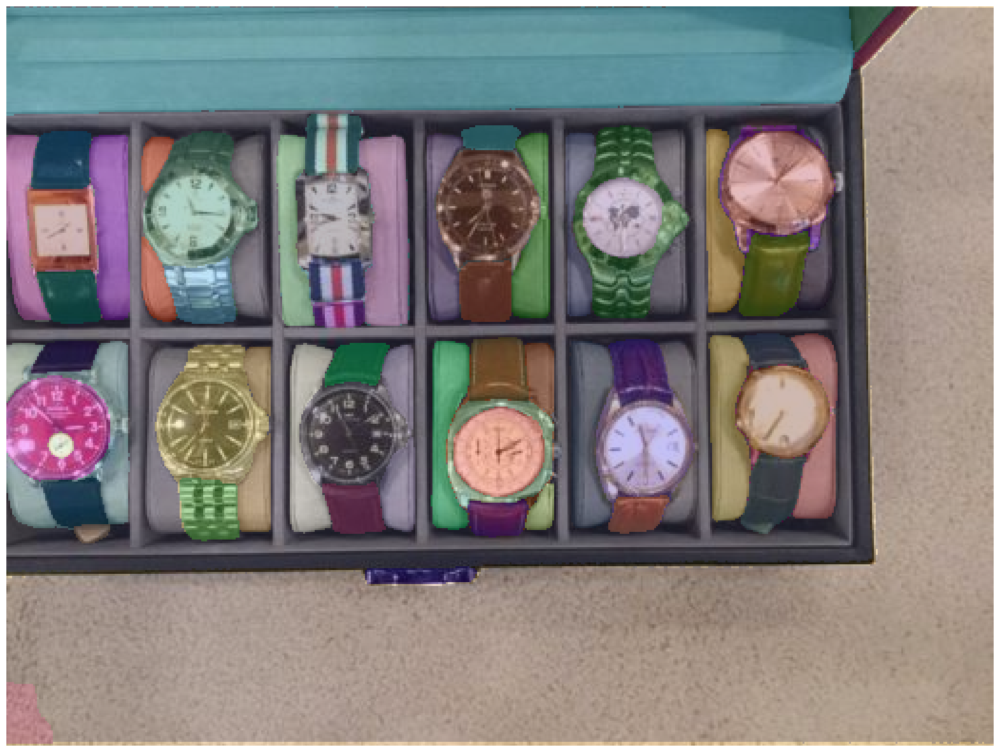

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

Number of objects detected in the image:  16
Mean Squared Error (MSE):  16.0
Root Mean Squared Error (RMSE):  4.0


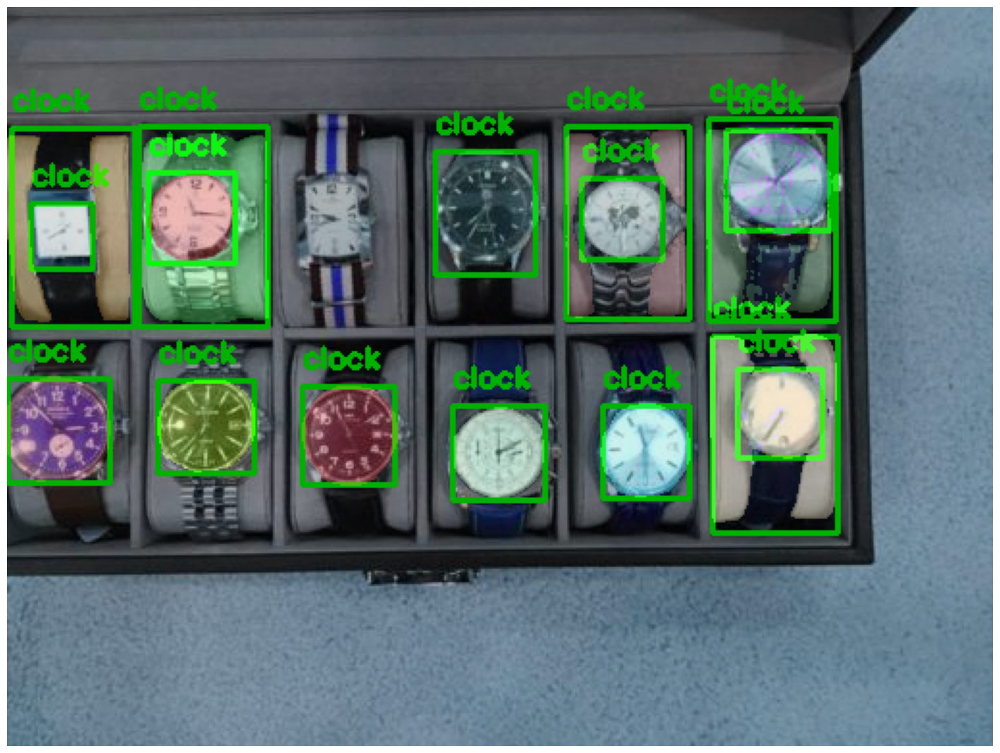

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 12
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction2.jpg')  # Save the combined output
plt.show()


[2024-02-12 00:03:42] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-02-12 00:03:42] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l
[2024-02-12 00:03:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


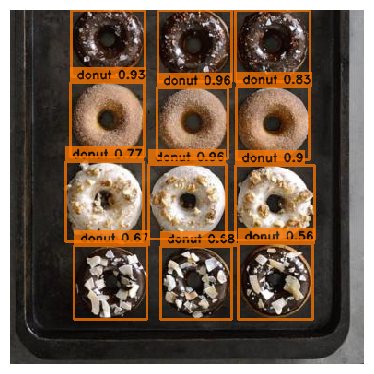

[2024-02-12 00:03:45] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


In [ ]:
image_path = '/content/3778.jpg'

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

model = models.get('yolo_nas_l', pretrained_weights="coco")
model.predict(image, conf=0.25).show()

conf_threshold = 0.25
detection_pred = model.predict(image_path, conf=conf_threshold)
detections = detection_pred.save('/content/output_folder/image5.jpg')

In [ ]:
# Extract bounding boxes, confidence scores, and labels
#detection_pred = model.predict(image_path, conf=conf_threshold)._images_prediction_lst

#bboxes_xyxy = detection_pred[0].prediction.bboxes_xyxy.tolist()
#confidence = detection_pred[0].prediction.confidence.tolist()
#labels = detection_pred[0].prediction.labels.tolist()

# Extract bounding boxes, confidence scores, and labels
detection_pred = model.predict(image_path, conf=conf_threshold)
bboxes_xyxy = detection_pred.prediction.bboxes_xyxy.tolist()
confidence = detection_pred.prediction.confidence.tolist()
labels = detection_pred.prediction.labels.tolist()  # Adjust this line based on the correct attribute name

[2024-02-12 00:04:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


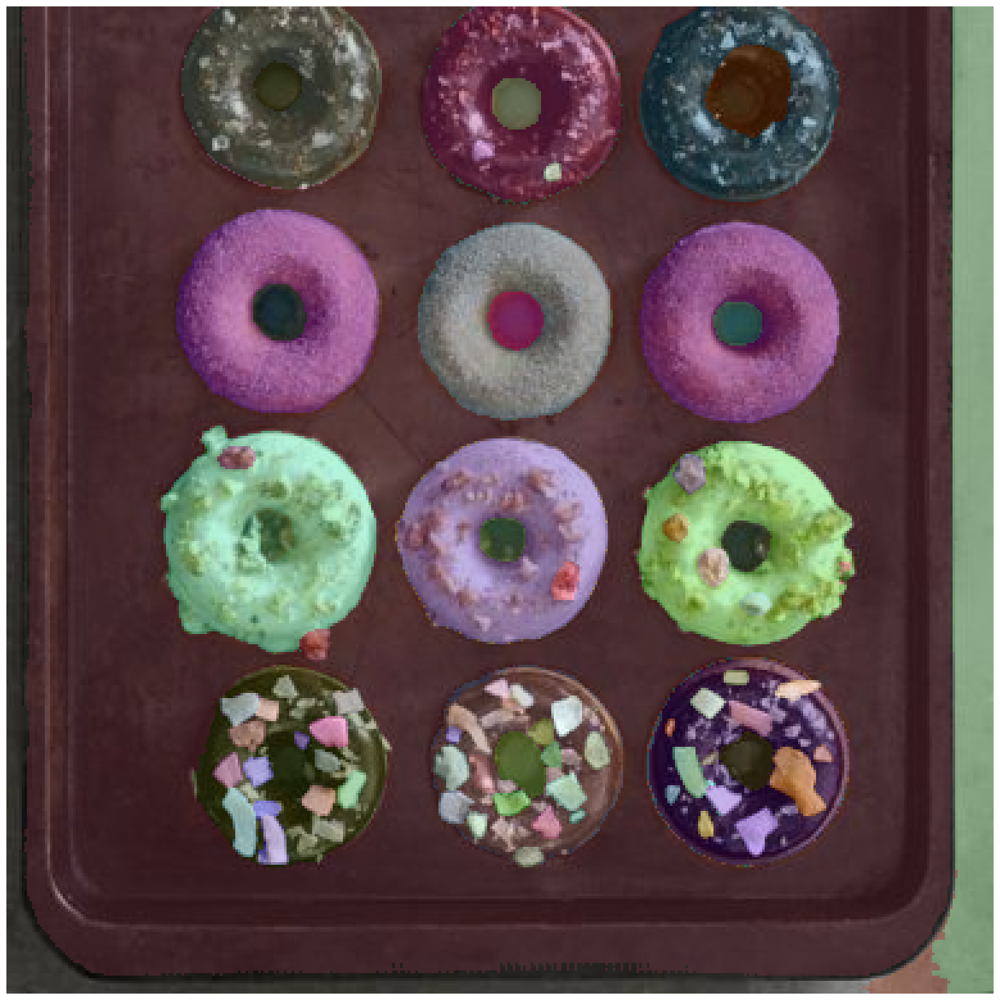

In [ ]:
# Instantiate mask generator
mask_generator = SamAutomaticMaskGenerator(sam)
mask = mask_generator.generate(image)

plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(mask)
plt.axis('off')
plt.show()

In [ ]:
# Create a predictor for SAM
image = cv2.imread(image_path)
predictor = SamPredictor(sam)
predictor.set_image(image)

# Initialize a combined mask
combined_mask = np.zeros((image.shape[0], image.shape[1], 3))

Number of objects detected in the image:  12
Mean Squared Error (MSE):  0.0
Root Mean Squared Error (RMSE):  0.0


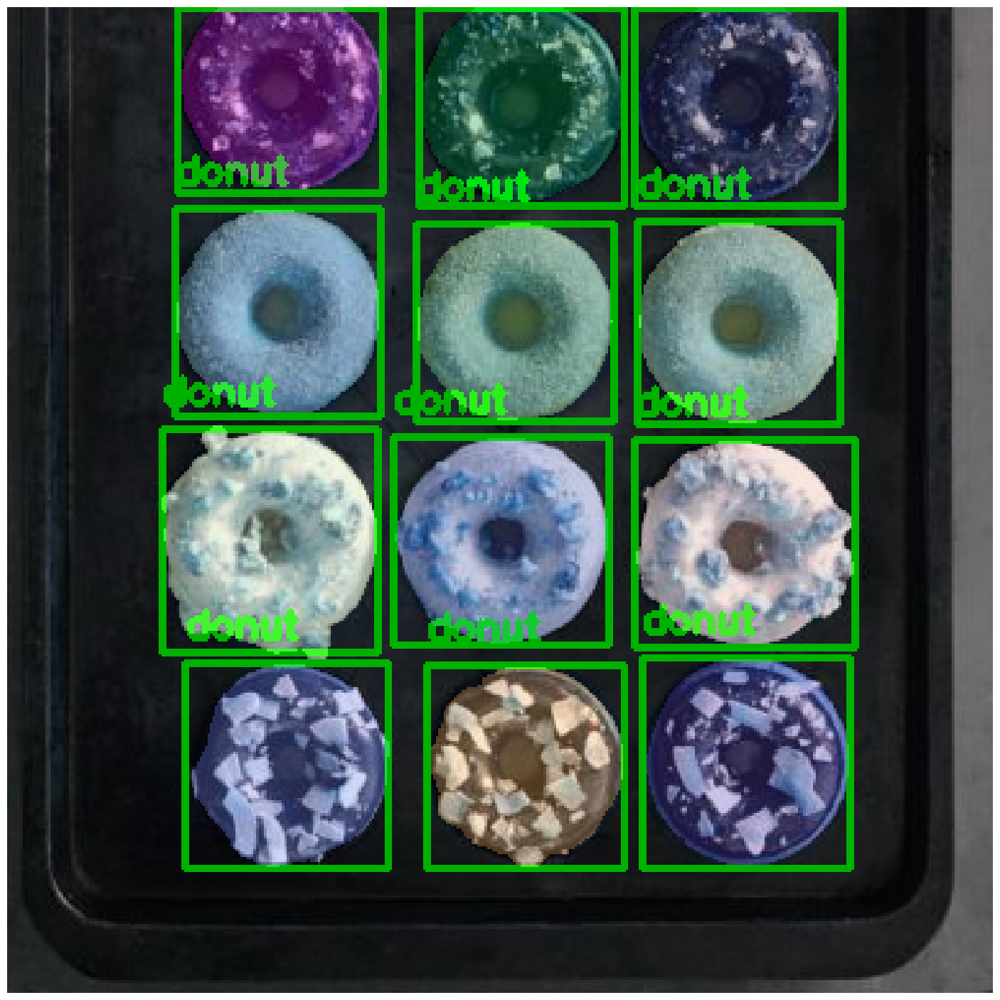

In [ ]:
# Initialize object count
object_count = 0

# Loop through detections
for i, label in enumerate(labels):
    input_box = np.array(bboxes_xyxy[i])

    # Predict mask using SAM
    mask, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False
    )

    # Get the correct class label
    cls = int(label)
    class_name = classNames[cls]

    # Draw bounding box
    x_min, y_min, x_max, y_max = input_box
    cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)

    # Add label
    cv2.putText(image, class_name, (int(x_min), int(y_min) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Increment object count
    object_count += 1

    # Generate random color for mask
    random_color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
    mask_color = np.array(random_color)

    # Add the mask to the combined mask with the random color
    combined_mask += mask[0][..., None] * mask_color

# Overlay the original image with the combined mask
final_image = cv2.addWeighted(image, 0.7, combined_mask.astype(np.uint8), 0.3, 0)

print("Number of objects detected in the image: ", object_count)
predicted_values = object_count
actual_values = 12
mse = np.mean((actual_values - predicted_values)**2)

# Calculate RMSE
rmse = np.sqrt(mse)

print("Mean Squared Error (MSE): ", mse)
print("Root Mean Squared Error (RMSE): ", rmse)
# Display the image
plt.figure(figsize=(18, 18))
plt.imshow(final_image)
plt.axis('off')
plt.savefig('output_folder/prediction2.jpg')  # Save the combined output
plt.show()
